# **Stable Diffusion** 🎨
*..usando 🧨difusores`*

es un modelo de difusión latente de texto a imagen creado por investigadores e ingenieros de CompVis, Stability AI y LAION. Está entrenado en imágenes de 512x512 píxeles de un subconjunto de la base de datos LAION-5B. Este modelo utiliza un codificador de texto CLIP ViT-L/14 congelado para condicionar el modelo con indicaciones de texto. Con sus 860 millones de parámetros UNet y 123 millones de parámetros en el codificador de texto, el modelo es relativamente liviano y puede ejecutarse en muchas GPU para consumidores. Consulta la tarjeta del modelo para obtener más información.

Este cuaderno de Colab muestra cómo usar Stable Diffusion con la biblioteca 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers).

¡Empecemos!

## 1. Cómo usar StableDiffusionPipeline

Antes de adentrarnos en los aspectos teóricos de cómo funciona Stable Diffusion, probémosla un poco 🤗.

En esta sección, te mostraremos cómo puedes realizar inferencias de texto a imagen en tan solo unas pocas líneas de código.

### Configuración

Primero, asegúrate de estar utilizando un entorno de ejecución con GPU para ejecutar este cuaderno, de modo que la inferencia sea mucho más rápida. Si el siguiente comando falla, utiliza el menú `Runtime` arriba y selecciona `Change runtime type`.

In [ ]:
!nvidia-smi

Thu Oct 19 09:06:22 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

A continuación, debes instalar `diffusers`, así como `scipy`, `ftfy` y `transformers`. `accelerate` se utiliza para lograr una carga mucho más rápida.

In [ ]:
!pip install diffusers==0.11.1
!pip install transformers scipy ftfy accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 15.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64

### Stable Diffusion Pipeline

`StableDiffusionPipeline` es un flujo de trabajo de inferencia de extremo a extremo que puedes utilizar para generar imágenes a partir de texto con tan solo unas pocas líneas de código.

En primer lugar, cargamos los pesos preentrenados de todos los componentes del modelo. En este cuaderno, utilizamos la versión 1.4 de Stable Diffusion ([CompVis/stable-diffusion-v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4)), pero existen otras variantes que quizás desees probar:
* [runwayml/stable-diffusion-v1-5](https://huggingface.co/runwayml/stable-diffusion-v1-5)
* [stabilityai/stable-diffusion-2-1-base](https://huggingface.co/stabilityai/stable-diffusion-2-1-base)
* [stabilityai/stable-diffusion-2-1](https://huggingface.co/stabilityai/stable-diffusion-2-1). Esta versión puede producir imágenes con una resolución de 768x768, mientras que las demás funcionan a 512x512.

IAdemás del ID del modelo [CompVis/stable-diffusion-v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4), también estamos pasando un `revision` y `torch_dtype` específicos al método `from_pretrained`.

Queremos asegurarnos de que cualquier usuario de Google Colab pueda ejecutar Stable Diffusion de manera gratuita, por lo tanto, cargamos los pesos de la rama de media precisión [`fp16`](https://huggingface.co/CompVis/stable-diffusion-v1-4/tree/fp16) y también le decimos a `diffusers` que espere los pesos en precisión de punto flotante de 16 bits pasando `torch_dtype=torch.float16`.

Si deseas garantizar la mayor precisión posible, asegúrate de eliminar `torch_dtype=torch.float16`, aunque esto aumentará el uso de memoria.

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)

AttributeError: module 'jax.random' has no attribute 'KeyArray'

A continuación, movamos el flujo de trabajo a la GPU para realizar inferencias más rápidas.

In [ ]:
pipe = pipe.to("cuda")

Y estamos listos para generar imágenes:

  0%|          | 0/50 [00:00<?, ?it/s]

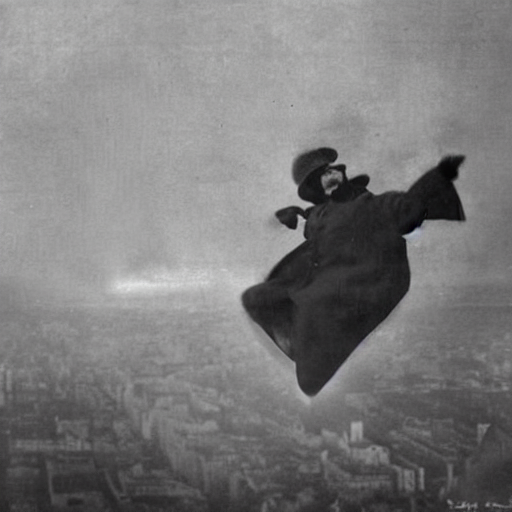

In [ ]:
#prompt = "surrealistic-style image of a young girl swimmer riding a horse, inspired by Grete Stern's photography"
#prompt = "abstract-style image of a young girl swimmer riding a horse, inspired by Grete Stern's photography"
prompt = "An ovni flying Berlin 1900, surrealistic photography by Breson"
#Esta línea define una variable llamada prompt y le asigna una cadena de texto que describe lo que se espera en la imagen generada.
#Esta descripción se utiliza como entrada para el modelo y es la base para generar la imagen deseada.

image = pipe(prompt).images[0]  # image here is in [PIL format](https://pillow.readthedocs.io/en/stable/)
#En esta línea, se utiliza el objeto pipe para generar una imagen a partir del texto proporcionado en el paso anterior (prompt).
#El resultado se almacena en la variable image. La parte .images[0] indica que estamos tomando la primera imagen generada por el modelo.

# Now to display an image you can either save it such as:
image.save(f"imagen.png")
#Aquí, se guarda la imagen generada en el sistema de archivos con el nombre de archivo "astronaut_rides_horse.png".
#Puedes cambiar el nombre del archivo según tus preferencias.

# or if you're in a google colab you can directly display it with
image
#Finalmente, esta línea muestra la imagen generada directamente en el entorno de Google Colab.
#La imagen generada se mostrará en la celda de salida si estás utilizando Google Colab.

Ejecutar la celda anterior varias veces te dará una imagen diferente cada vez. Si deseas obtener un resultado determinista, puedes pasar una semilla aleatoria al flujo de trabajo. Cada vez que uses la misma semilla, obtendrás el mismo resultado de imagen.

  0%|          | 0/50 [00:00<?, ?it/s]

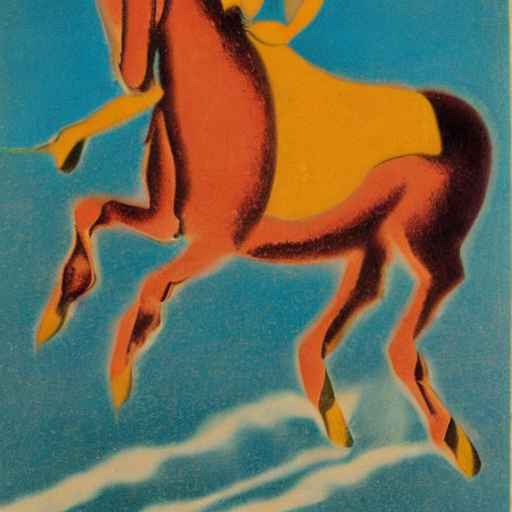

In [ ]:
import torch
#Esta línea importa la biblioteca PyTorch, que es una biblioteca popular para el aprendizaje profundo y se utiliza para operaciones numéricas y de cálculo en tensores.

generator = torch.Generator("cuda").manual_seed(500)
#Aquí, se crea un generador de números aleatorios de PyTorch. El argumento "cuda" indica que el generador se utilizará en la GPU (si está disponible),
#lo que puede ser útil para asegurar la reproducibilidad de resultados cuando se generan imágenes de manera determinística.
#Luego, se establece una semilla manual para el generador con el valor 1024. Esto significa que, si vuelves a ejecutar este código con la misma semilla, obtendrás la misma imagen generada.

image = pipe(prompt, generator=generator).images[0]
#Esta línea utiliza el generador creado en el paso anterior para generar una imagen basada en el texto proporcionado en la variable prompt.
#El resultado se almacena en la variable image. Nuevamente, se toma la primera imagen generada por el modelo con .images[0].

image
#Finalmente, esta línea muestra la imagen generada en la celda de salida del entorno. La imagen generada se mostrará en el lugar donde se ejecuta este código.

Puedes cambiar el número de pasos de inferencia utilizando el argumento `num_inference_steps`. En general, los resultados son mejores cuanto más pasos uses. Dado que Stable Diffusion es uno de los modelos más recientes, funciona muy bien con un número relativamente pequeño de pasos, por lo que recomendamos utilizar el valor predeterminado de `50`. Si deseas obtener resultados más rápidos, puedes usar un número menor.

La celda siguiente utiliza la misma semilla que antes, pero con menos pasos. Observa cómo algunos detalles, como la cabeza del caballo o el casco, son menos definidos y realistas que en la imagen anterior.

  0%|          | 0/300 [00:00<?, ?it/s]

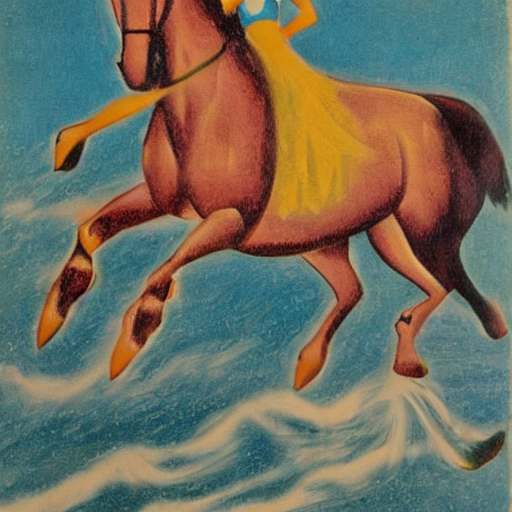

In [ ]:
import torch

generator = torch.Generator("cuda").manual_seed(500)

image = pipe(prompt, num_inference_steps=300, generator=generator).images[0]

image

El otro parámetro en la llamada al flujo de trabajo es `guidance_scale`. Es una forma de aumentar la adherencia a la señal condicional, que en este caso es el texto, así como la calidad general de la muestra. En términos simples, la guía sin clasificador fuerza a la generación a que se ajuste mejor a la indicación proporcionada. Números como `7` u `8.5` suelen dar buenos resultados; si utilizas un número muy grande, las imágenes pueden parecer buenas, pero serán menos diversas.

Puedes obtener más detalles técnicos sobre este parámetro en [la ultima seccion](https://colab.research.google.com/drive/1ALXuCM5iNnJDNW5vqBm5lCtUQtZJHN2f?authuser=1#scrollTo=UZp-ynZLrS-S) de este cuaderno.

Para generar varias imágenes para el mismo texto de entrada, simplemente utilizamos una lista con el mismo texto repetido varias veces. Enviaremos esta lista al flujo de trabajo en lugar de la cadena de texto que usamos anteriormente.

Primero, escribamos una función auxiliar para mostrar una cuadrícula de imágenes. Simplemente ejecuta la siguiente celda para crear la función `image_grid`, o muestra el código si estás interesado en cómo se hace.

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

Ahora, podemos generar una imagen en forma de cuadrícula después de haber ejecutado el flujo de trabajo con una lista de 3 indicaciones.

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


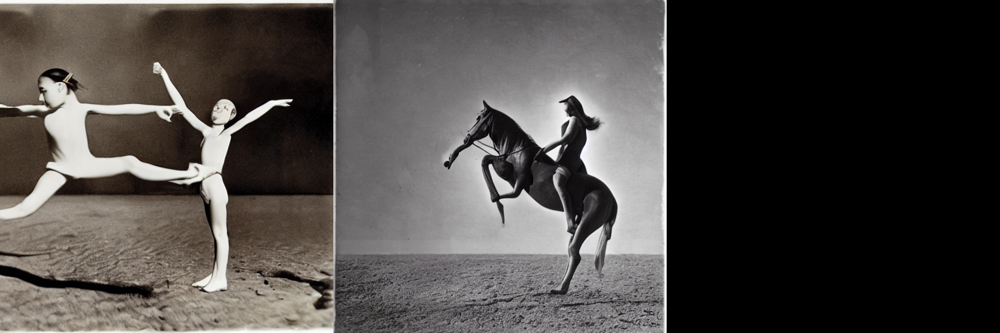

In [ ]:
num_images = 3
prompt = ["surrealistic-style image of a young girl swimmer riding a horse, inspired by Grete Stern's photography"] * num_images

images = pipe(prompt).images

grid = image_grid(images, rows=1, cols=3)
grid

And here's how to generate a grid of `n × m` images.

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


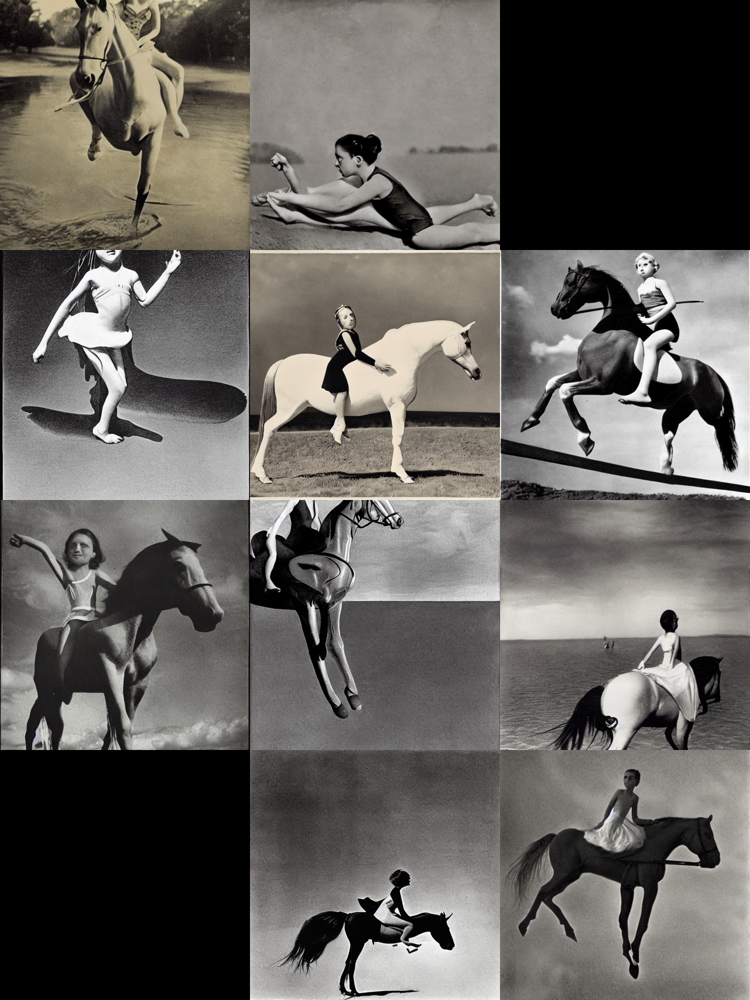

In [ ]:
num_cols = 3
num_rows = 4

prompt = ["surrealistic-style image of a young girl swimmer riding a horse, inspired by Grete Stern's photography"] * num_cols

all_images = []
for i in range(num_rows):
  images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

###Generar imágenes no cuadradas

Por defecto, Stable Diffusion produce imágenes de `512 × 512` píxeles. Pero es muy fácil anular esta configuración predeterminada utilizando los argumentos `height` (altura) y `width` (ancho), de modo que puedas crear imágenes rectangulares en proporciones de retrato o paisaje.

Aquí tienes algunas recomendaciones para elegir tamaños de imagen adecuados:

- Asegúrate de que tanto la `altura` como el `ancho` sean múltiplos de `8`.
- Reducir por debajo de 512 puede dar como resultado imágenes de menor calidad.
- Aumentar por encima de 512 en ambas direcciones puede repetir áreas de la imagen (se pierde la coherencia global).
- La mejor manera de crear imágenes no cuadradas es utilizar `512` en una dimensión y un valor mayor que eso en la otra.

  0%|          | 0/50 [00:00<?, ?it/s]

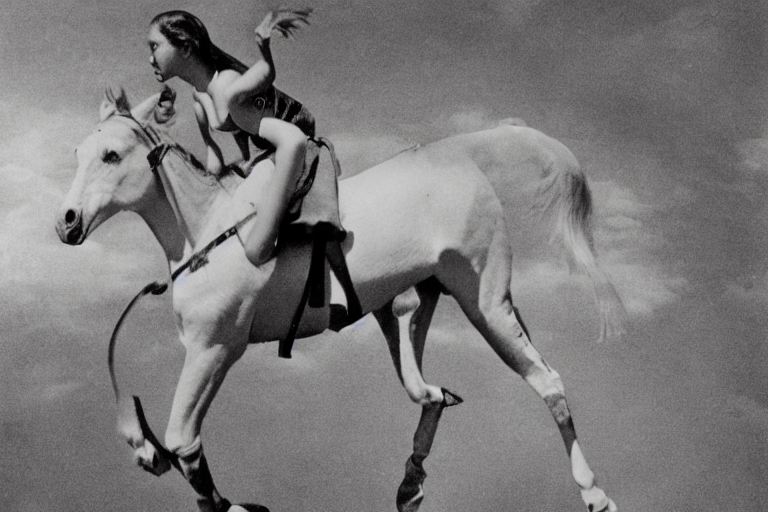

In [ ]:
prompt = "surrealistic-style image of a young girl swimmer riding a horse, inspired by Grete Stern's photography"

image = pipe(prompt, height=512, width=768).images[0]
image

## 2. What is Stable Diffusion

Now, let's go into the theoretical part of Stable Diffusion 👩‍🎓.

Stable Diffusion is based on a particular type of diffusion model called **Latent Diffusion**, proposed in [High-Resolution Image Synthesis with Latent Diffusion Models](https://arxiv.org/abs/2112.10752).



General diffusion models are machine learning systems that are trained to *denoise* random gaussian noise step by step, to get to a sample of interest, such as an *image*. For a more detailed overview of how they work, check [this colab](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb).

Diffusion models have shown to achieve state-of-the-art results for generating image data. But one downside of diffusion models is that the reverse denoising process is slow. In addition, these models consume a lot of memory because they operate in pixel space, which becomes unreasonably expensive when generating high-resolution images. Therefore, it is challenging to train these models and also use them for inference.



<br>

Latent diffusion can reduce the memory and compute complexity by applying the diffusion process over a lower dimensional _latent_ space, instead of using the actual pixel space. This is the key difference between standard diffusion and latent diffusion models: **in latent diffusion the model is trained to generate latent (compressed) representations of the images.**

There are three main components in latent diffusion.

1. An autoencoder (VAE).
2. A [U-Net](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb#scrollTo=wW8o1Wp0zRkq).
3. A text-encoder, *e.g.* [CLIP's Text Encoder](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

**1. The autoencoder (VAE)**

The VAE model has two parts, an encoder and a decoder. The encoder is used to convert the image into a low dimensional latent representation, which will serve as the input to the *U-Net* model.
The decoder, conversely, transforms the latent representation back into an image.

 During latent diffusion _training_, the encoder is used to get the latent representations (_latents_) of the images for the forward diffusion process, which applies more and more noise at each step. During _inference_, the denoised latents generated by the reverse diffusion process are converted back into images using the VAE decoder. As we will see during inference we **only need the VAE decoder**.

**2. The U-Net**

The U-Net has an encoder part and a decoder part both comprised of ResNet blocks.
The encoder compresses an image representation into a lower resolution image representation and the decoder decodes the lower resolution image representation back to the original higher resolution image representation that is supposedly less noisy.
More specifically, the U-Net output predicts the noise residual which can be used to compute the predicted denoised image representation.

To prevent the U-Net from losing important information while downsampling, short-cut connections are usually added between the downsampling ResNets of the encoder to the upsampling ResNets of the decoder.
Additionally, the stable diffusion U-Net is able to condition its output on text-embeddings via cross-attention layers. The cross-attention layers are added to both the encoder and decoder part of the U-Net usually between ResNet blocks.

**3. The Text-encoder**

The text-encoder is responsible for transforming the input prompt, *e.g.* "An astronout riding a horse" into an embedding space that can be understood by the U-Net. It is usually a simple *transformer-based* encoder that maps a sequence of input tokens to a sequence of latent text-embeddings.

Inspired by [Imagen](https://imagen.research.google/), Stable Diffusion does **not** train the text-encoder during training and simply uses an CLIP's already trained text encoder, [CLIPTextModel](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

**Why is latent diffusion fast and efficient?**

Since the U-Net of latent diffusion models operates on a low dimensional space, it greatly reduces the memory and compute requirements compared to pixel-space diffusion models. For example, the autoencoder used in Stable Diffusion has a reduction factor of 8. This means that an image of shape `(3, 512, 512)` becomes `(3, 64, 64)` in latent space, which requires `8 × 8 = 64` times less memory.

This is why it's possible to generate `512 × 512` images so quickly, even on 16GB Colab GPUs!

**Stable Diffusion during inference**

Putting it all together, let's now take a closer look at how the model works in inference by illustrating the logical flow.


<p align="left">
<img src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png" alt="sd-pipeline" width="500"/>
</p>

The stable diffusion model takes both a latent seed and a text prompt as an input. The latent seed is then used to generate random latent image representations of size $64 \times 64$ where as the text prompt is transformed to text embeddings of size $77 \times 768$ via CLIP's text encoder.

Next the U-Net iteratively *denoises* the random latent image representations while being conditioned on the text embeddings. The output of the U-Net, being the noise residual, is used to compute a denoised latent image representation via a scheduler algorithm. Many different scheduler algorithms can be used for this computation, each having its pros and cons. For Stable Diffusion, we recommend using one of:

- [PNDM scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_pndm.py) (used by default).
- [K-LMS scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_lms_discrete.py).
- [Heun Discrete scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_heun_discrete.py).
- [DPM Solver Multistep scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_dpmsolver_multistep.py). This scheduler is able to achieve great quality in less steps. You can try with 25 instead of the default 50!

Theory on how the scheduler algorithm function is out of scope for this notebook, but in short one should remember that they compute the predicted denoised image representation from the previous noise representation and the predicted noise residual.
For more information, we recommend looking into [Elucidating the Design Space of Diffusion-Based Generative Models](https://arxiv.org/abs/2206.00364)

The *denoising* process is repeated *ca.* 50 times to step-by-step retrieve better latent image representations.
Once complete, the latent image representation is decoded by the decoder part of the variational auto encoder.



After this brief introduction to Latent and Stable Diffusion, let's see how to make advanced use of 🤗 Hugging Face Diffusers!

## 3. How to write your own inference pipeline with `diffusers`

Finally, we show how you can create custom diffusion pipelines with `diffusers`.
This is often very useful to dig a bit deeper into certain functionalities of the system and to potentially switch out certain components.

In this section, we will demonstrate how to use Stable Diffusion with a different scheduler, namely [Katherine Crowson's](https://github.com/crowsonkb) K-LMS scheduler that was added in [this PR](https://github.com/huggingface/diffusers/pull/185#pullrequestreview-1074247365).

Let's go through the `StableDiffusionPipeline` step by step to see how we could have written it ourselves.

We will start by loading the individual models involved.

In [ ]:
import torch
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

The [pre-trained model](https://huggingface.co/CompVis/stable-diffusion-v1-3-diffusers/tree/main) includes all the components required to setup a complete diffusion pipeline. They are stored in the following folders:
- `text_encoder`: Stable Diffusion uses CLIP, but other diffusion models may use other encoders such as `BERT`.
- `tokenizer`. It must match the one used by the `text_encoder` model.
- `scheduler`: The scheduling algorithm used to progressively add noise to the image during training.
- `unet`: The model used to generate the latent representation of the input.
- `vae`: Autoencoder module that we'll use to decode latent representations into real images.

We can load the components by referring to the folder they were saved, using the `subfolder` argument to `from_pretrained`.

In [ ]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

Downloading:   0%|          | 0.00/335M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/522 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/961k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/389 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/905 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.6.mlp.fc2.bias', 'vision_model.encoder.layers.2.self_attn.q_proj.weight', 'vision_model.encoder.layers.23.layer_norm2.weight', 'vision_model.encoder.layers.5.self_attn.out_proj.weight', 'vision_model.encoder.layers.11.layer_norm2.weight', 'vision_model.encoder.layers.0.self_attn.k_proj.weight', 'vision_model.encoder.layers.14.self_attn.v_proj.weight', 'vision_model.encoder.layers.2.self_attn.out_proj.weight', 'vision_model.encoder.layers.17.layer_norm1.weight', 'vision_model.encoder.layers.13.self_attn.out_proj.bias', 'vision_model.encoder.layers.10.self_attn.out_proj.weight', 'vision_model.encoder.layers.22.self_attn.q_proj.bias', 'vision_model.encoder.layers.1.self_attn.k_proj.weight', 'vision_model.encoder.layers.19.self_attn.k_proj.bias', 'vision_model.encoder.layers.12.mlp.fc1.weight', 'vision_model.encoder.layers.2.self_attn.q_proj.bia

Downloading:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/743 [00:00<?, ?B/s]

Now instead of loading the pre-defined scheduler, we'll use the K-LMS scheduler instead.

In [ ]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

Downloading:   0%|          | 0.00/313 [00:00<?, ?B/s]

Next we move the models to the GPU.

In [ ]:
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device)

We now define the parameters we'll use to generate images.

Note that `guidance_scale` is defined analog to the guidance weight `w` of equation (2) in the [Imagen paper](https://arxiv.org/pdf/2205.11487.pdf). `guidance_scale == 1` corresponds to doing no classifier-free guidance. Here we set it to 7.5 as also done previously.

In contrast to the previous examples, we set `num_inference_steps` to 100 to get an even more defined image.

In [ ]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion

num_inference_steps = 100            # Number of denoising steps

guidance_scale = 7.5                # Scale for classifier-free guidance

generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise

batch_size = 1

First, we get the text_embeddings for the prompt. These embeddings will be used to condition the UNet model.

In [ ]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

with torch.no_grad():
  text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

We'll also get the unconditional text embeddings for classifier-free guidance, which are just the embeddings for the padding token (empty text). They need to have the same shape as the conditional `text_embeddings` (`batch_size` and `seq_length`)

In [ ]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
  uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

For classifier-free guidance, we need to do two forward passes. One with the conditioned input (`text_embeddings`), and another with the unconditional embeddings (`uncond_embeddings`). In practice, we can concatenate both into a single batch to avoid doing two forward passes.

In [ ]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

Generate the intial random noise.

In [ ]:
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)

In [ ]:
latents.shape

torch.Size([1, 4, 64, 64])

Cool $64 \times 64$ is expected. The model will transform this latent representation (pure noise) into a `512 × 512` image later on.

Next, we initialize the scheduler with our chosen `num_inference_steps`.
This will compute the `sigmas` and exact time step values to be used during the denoising process.

In [ ]:
scheduler.set_timesteps(num_inference_steps)

The K-LMS scheduler needs to multiply the `latents` by its `sigma` values. Let's do this here

In [ ]:
latents = latents * scheduler.init_noise_sigma

We are ready to write the denoising loop.

In [ ]:
from tqdm.auto import tqdm
from torch import autocast

for t in tqdm(scheduler.timesteps):
  # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
  latent_model_input = torch.cat([latents] * 2)

  latent_model_input = scheduler.scale_model_input(latent_model_input, t)

  # predict the noise residual
  with torch.no_grad():
    noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

  # perform guidance
  noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
  noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

  # compute the previous noisy sample x_t -> x_t-1
  latents = scheduler.step(noise_pred, t, latents).prev_sample

  0%|          | 0/100 [00:00<?, ?it/s]

We now use the `vae` to decode the generated `latents` back into the image.

In [ ]:
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents

with torch.no_grad():
  image = vae.decode(latents).sample

And finally, let's convert the image to PIL so we can display or save it.

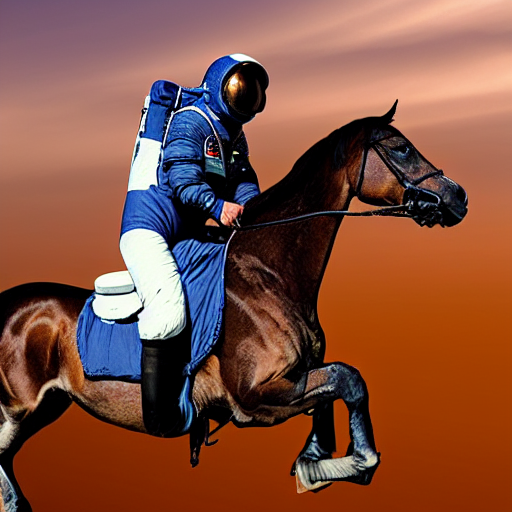

In [ ]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]

Now you have all the pieces to build your own pipelines or use diffusers components as you like 🔥.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=9be9d3e5-4f25-48e6-912d-b59b8644d952' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>